In [86]:
import os
import numpy as np
import pandas as pd
import random
import folium
from folium import plugins
import seaborn as sns
import cv2
import matplotlib.pyplot as plt
import IPython
import time
import plotly.express as px
from folium.plugins import HeatMap
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, plot, iplot

# Overview động đất trên toàn Thế giới

In [87]:
world=pd.read_csv('/kaggle/input/earthquake/world.csv')

In [88]:
# Find the location with the highest magnitude of earthquakes
max_mag = world['mag'].max()
max_mag_index = world[world['mag'] == max_mag].index[0]
max_mag_latitude = world.loc[max_mag_index, 'latitude']
max_mag_longitude = world.loc[max_mag_index, 'longitude']

# Create a base map centered on the location with the highest magnitude
map = folium.Map(location=[max_mag_latitude, max_mag_longitude], tiles='cartodbpositron', zoom_start=5)


# Filter out earthquakes with magnitude 6
df_quakes = world[world['mag'] > 6]

# Add a heatmap of earthquakes to the map
heatmap = plugins.HeatMap(data=df_quakes[['latitude', 'longitude']].values.tolist(), radius=15)
heatmap.add_to(map)

# Display the map
map

In [89]:
from folium.plugins import MarkerCluster

# Create a base map
map = folium.Map(location=[45.5236, -122.6750], tiles='cartodbpositron', zoom_start=1)

# Define the colors for the markers based on magnitude
colors = {
    6: 'green',
    7: 'yellow',
    8: 'orange',
    9: 'red'
}

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(map)

# Add markers for earthquakes to the MarkerCluster object
for lat, lon, mag in zip(df_quakes['latitude'], df_quakes['longitude'], df_quakes['mag']):
    # Define the color of the marker based on magnitude
    color = colors.get(int(mag), 'blue')
    # Create the marker with the custom color and a tooltip showing the magnitude
    folium.Marker([lat, lon], icon=folium.Icon(color=color), tooltip=f"Magnitude: {mag:.1f}").add_to(marker_cluster)

# Add a legend to the map
legend_html = """
     <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 200px; height: 150px; 
                 border:2px solid grey; z-index:9999; font-size:14px;
                  background-image: url('https://th.bing.com/th/id/R.cf2922b9c74a11dd76146e2171397e59?rik=DraFhPTppE48LQ&riu=http%3a%2f%2fwonderfulengineering.com%2fwp-content%2fuploads%2f2016%2f01%2fblack-wallpaper-3.jpg&ehk=By%2fOyu69UBtmC8dDgg6mIgYH0qZeo7Fhtj%2bmQnue9pM%3d&risl=&pid=ImgRaw&r=0');
                 background-repeat: no-repeat;
                 background-size: 100% 100%;
                 ">
     <p style="padding-left: 10px; font-weight:bold; color:white">Cường độ</p>
     <p style="padding-left: 30px; color:green">6 - 6.9</p>
     <p style="padding-left: 30px; color:yellow">7 - 7.9</p>
     <p style="padding-left: 30px; color:orange">8 - 8.9</p>
     <p style="padding-left: 30px; color:red">9+</p>
     </div>
     """
map.get_root().html.add_child(folium.Element(legend_html))

# Display the map
map

/tmp/ipykernel_34/3827120960.py:22: UserWarning:

color argument of Icon should be one of: {'red', 'beige', 'cadetblue', 'lightgray', 'purple', 'white', 'lightgreen', 'pink', 'darkgreen', 'darkblue', 'orange', 'black', 'blue', 'green', 'lightblue', 'darkred', 'gray', 'lightred', 'darkpurple'}.



# Overview động đất tại Nhật Bản

In [90]:
japan=pd.read_csv('/kaggle/input/earthquake/earthquake.csv')

In [91]:
japan["datetime"] = pd.to_datetime(japan["time"])

japan["year"] = japan["datetime"].dt.year
japan["month"] = japan["datetime"].dt.month
japan["day"] = japan["datetime"].dt.day
japan["hour"] = japan["datetime"].dt.hour

In [92]:
tectonic_plates = pd.read_csv("/kaggle/input/tectonic-plate-boundaries/all.csv" )

In [93]:
#Ploting the tectonic plate's boundaries 
tectonic = folium.Map(tiles="cartodbpositron", zoom_start=5)

plates = list(tectonic_plates["plate"].unique())
for plate in plates:
    plate_vals = tectonic_plates[tectonic_plates["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], popup=plate, color="#58508d", fill=False, ).add_to(tectonic)

tectonic

In [94]:
# Create a base map with plate boundaries and years
jp_tectonics  =  folium.Map(location=[37, 138],tiles='Stamen Terrain', zoom_start=5)
gradient = {.33: "#628d82", .66: "#a3c5bf", 1: "#eafffd"} 
plates = list(tectonic_plates["plate"].unique())
for plate in plates:
    plate_vals = tectonic_plates[tectonic_plates["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], fill=False,  color="#58508d").add_to(jp_tectonics)
        
def colormag(val):
            if val < 2008:
                return "#ffcf6a"
            elif val < 2015:
                return "#fb8270"
            else:
                return "#bc5090"
            
for i in range(0,len(japan)):
    folium.Circle(location=[japan.iloc[i]["latitude"], japan.iloc[i]["longitude"]],radius=2000, color=colormag(japan.iloc[i]["year"])).add_to(jp_tectonics)

#A bit of extra code to get legent 
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>

</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Phân bố động đất theo năm</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#ffcf6a;opacity:1;'></span>2000 - 2007</li>
    <li><span style='background:#fb8270;opacity:1;'></span>2007 - 2014</li>
    <li><span style='background:#bc5090;opacity:1;'></span>2014 - 2022</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

jp_tectonics.get_root().add_child(macro)

jp_tectonics

**Động đất tại Tohoku năm 2011**

In [95]:
tohoku=japan[japan['mag']==9.1]

In [96]:
thk_tectonics  =  folium.Map(location=[37, 138],tiles='Stamen Terrain', zoom_start=5)
gradient = {.33: "#628d82", .66: "#a3c5bf", 1: "#eafffd"} 
plates = list(tectonic_plates["plate"].unique())
for plate in plates:
    plate_vals = tectonic_plates[tectonic_plates["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], fill=False,  color="#58508d").add_to(thk_tectonics)
            
for i, r in tohoku.iterrows():
    folium.CircleMarker(location=[r["latitude"],r["longitude"]], radius=1, popup=r["place"], color='red').add_to(thk_tectonics)

thk_tectonics.add_child(plugins.HeatMap(tohoku[["latitude", "longitude"]]))  
thk_tectonics

# Overview những trận động đất kèm sóng thần, núi lửa

In [99]:
vol=pd.read_csv('/kaggle/input/earthquake/volcanos-overview.csv')
eaq=pd.read_csv('/kaggle/input/earthquake/earthquake_damage.csv')
tsu=pd.read_csv('/kaggle/input/earthquake/tsunamis-overview.csv')

In [100]:
vol = vol.drop(['Search Parameters'], axis=1)
vol = vol.drop(labels=0, axis=0)
vol = vol.fillna(0)
vol = vol[vol['Tsu'] > 0]
vol = vol.reset_index()

In [101]:
tsu = tsu.drop(['Search Parameters'], axis=1)
tsu = tsu.drop(labels=0, axis=0)
tsu = tsu.fillna(0)
tsu = tsu[tsu['Tsunami Cause Code'] != 9]
tsu = tsu.drop(['Tsunami Event Validity'], axis=1)
tsu = tsu.drop(['Tsunami Cause Code'], axis=1)
tsu = tsu.drop(['More Info'], axis=1)
tsu = tsu.drop(['Deposits'], axis=1)
tsu = tsu.drop(['Country'], axis=1)
tsu = tsu.reset_index()

Text(0.5, 1.0, 'Cường độ của những trận động đất gây ra sóng thần kèm theo')

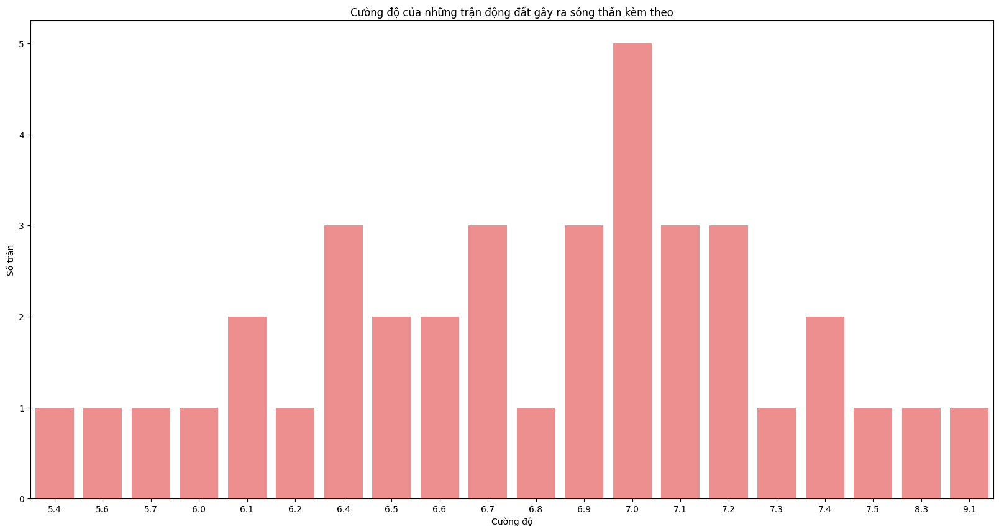

In [102]:
plt.figure(figsize=(20,10))
sns.countplot(x=tsu["Earthquake Magnitude"], color="red", alpha=0.5)
plt.xlabel("Cường độ")
plt.ylabel("Số trận")
plt.title("Cường độ của những trận động đất gây ra sóng thần kèm theo")

In [103]:
etv_tectonics  =  folium.Map(location=[37, 138],tiles='Stamen Terrain', zoom_start=5)
gradient = {.33: "#628d82", .66: "#a3c5bf", 1: "#eafffd"} 
plates = list(tectonic_plates["plate"].unique())
for plate in plates:
    plate_vals = tectonic_plates[tectonic_plates["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], fill=False,  color="#58508d").add_to(etv_tectonics)
            
for i in range(0,len(eaq)):
    folium.Circle(location=[eaq.iloc[i]["Latitude"], eaq.iloc[i]["Longitude"]],radius=2000, color='red').add_to(etv_tectonics)

for i in range(0,len(vol)):
    folium.Circle(location=[vol.iloc[i]["Latitude"], vol.iloc[i]["Longitude"]],radius=2000, color='yellow').add_to(etv_tectonics)

for i in range(0,len(tsu)):
    folium.Circle(location=[tsu.iloc[i]["Latitude"], tsu.iloc[i]["Longitude"]],radius=2000, color='blue').add_to(etv_tectonics)

#A bit of extra code to get legent 
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>

</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Thảm họa thiên nhiên</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:red;opacity:1;'></span>Động đất</li>
    <li><span style='background:blue;opacity:1;'></span>Sóng thần</li>
    <li><span style='background:yellow;opacity:1;'></span>Núi lửa</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

etv_tectonics.get_root().add_child(macro)

etv_tectonics